# Benchmark Analysis Notebook

Mirrors `analysis.ipynb` for classical spatial interpolation benchmarks.

Runs **IDW** and **Kriging** with `return_detailed=True`, then produces:
1. **Error analysis** – per-station spatial error maps, bias map, ranking, isolation plot
2. **Regression scatter** – actual vs. predicted, single-model and side-by-side comparison
3. **Aggregate metric comparison** – grouped bar chart across all models / folds
4. **Per-timestep error time series** – RMSE / MAE curves, optionally overlaid
5. **Grid visualisation** – IDW-interpolated predictions on a 1 km² grid, matching analysis.ipynb:
   - Single timestep heatmap
   - Sequence of N timesteps
   - Mean rainfall heatmap
   - Animated time series

**Adding a new benchmark model** later: run it with `return_detailed=True`, append its result
to `all_results`, and all comparison plots update automatically.

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import HTML

from src.utils import read_config
from src.visualization.main import visualise_singapore_outline, visualise_with_basemap
from src.visualization.error_analysis import get_viz_scales
from src.sampling.main import stratified_spatial_kfold_dual
from src.raingauge.utils import load_raingauge_dataset
from src.radar.utils import load_processed_dataset

from benchmarks.models.idwbenchmark import run_IDW_benchmark
from benchmarks.models.kriging import run_kriging_benchmark

from benchmarks.visualization import (
    compute_per_station_metrics,
    plot_spatial_error_map,
    plot_bias_map,
    plot_error_ranking,
    plot_error_vs_isolation,
    plot_regression_scatter,
    plot_density_scatter,
    plot_regression_comparison,
    plot_metrics_comparison,
    plot_timestep_metrics,
    plot_timestep_comparison,
    plot_station_rainfall_timeseries,
    interpolate_to_grid,
    plot_rainfall_grid,
    plot_rainfall_sequence,
    animate_rainfall_grid,
)

/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/requests/__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


## Configuration

Change the settings in this cell. Everything else runs automatically.

In [2]:
# ── CHANGE THESE ──────────────────────────────────────────────────────────────
FOLD_IDX       = 4       # fold used for aggregate metrics, timestep plots & grid vis
RAIN_THRESHOLD = 0.5     # mm/hr threshold for binary rain/no-rain F1

# IDW
N_NEAREST_IDW  = 6
IDW_POWER      = 2

# Kriging
KRIGING_METHOD  = "ordinary"   # "ordinary" | "universal" | "ked"
VARIOGRAM_MODEL = "spherical"  # "linear" | "power" | "gaussian" | "spherical" | "exponential"
RUN_RADAR       = False        # set True to use KED kriging (needs radar data)
RADAR_PKL       = "database/processed_radar_dataset.pkl"

# Grid visualisation
RESOLUTION_KM  = 1.0   # grid spacing in km
GRID_MODEL     = "IDW" # which model's predictions to interpolate onto the grid
# ──────────────────────────────────────────────────────────────────────────────

config     = read_config("config.yaml")
FOLD_COUNT = config["training_params"]["fold_count"]
BOUNDS     = config["dataset_parameters"]["geography_bounds"]
START_YEAR = config["dataset_parameters"]["start_year"]
END_YEAR   = config["dataset_parameters"]["end_year"]
UPTIME     = config["filters"]["uptime_threshold"]
SEED       = config["training_params"]["seed"]

# Analysis / time-window settings (shared with analysis.ipynb / analysis_st.ipynb)
_viz = config.get("analysis", {})
TIME_START         = _viz.get("time_start", None)
TIME_END           = _viz.get("time_end",   None)
ROLLING_WINDOW     = _viz.get("rolling_window", 96)
SELECTED_STATION   = _viz.get("selected_station", None)
TS_DISPLAY_START   = _viz.get("ts_display_start", None)
TS_FRAME_COUNT     = _viz.get("ts_frame_count",   None)

# Fixed visualisation scales — loaded from config.yaml visualisation section
SCALES         = get_viz_scales("config.yaml")
COMPARE_METRICS = SCALES["compare_metrics"]   # e.g. ['rmse', 'pearson_r']
METRIC_SCALES  = SCALES["metric_scales"]      # {metric: {vmin, vmax, boundaries}}
RAINFALL_SCALE = SCALES["rainfall"]           # {vmin, vmax, boundaries}

print(f"Bounds          : {BOUNDS}")
print(f"Folds           : {FOLD_COUNT}")
print(f"Time window     : {TIME_START} → {TIME_END}  (None = full period)")
print(f"Rolling         : {ROLLING_WINDOW} steps")
print(f"Compare metrics : {COMPARE_METRICS}")
print(f"TS display start: {TS_DISPLAY_START}  (None = from beginning)")
print(f"TS frame count  : {TS_FRAME_COUNT}  (None = all frames)")
print(f"Rainfall scale  : vmin={RAINFALL_SCALE['vmin']}, vmax={RAINFALL_SCALE['vmax']}")

Bounds          : {'left': 103.6, 'right': 104.1, 'top': 1.5, 'bottom': 1.188}
Folds           : 5
Time window     : 2024-06-17 → 2025-04-30  (None = full period)
Rolling         : 96 steps
Compare metrics : ['rmse', 'pearson_r']
TS display start: 2025-04-20  (None = from beginning)
TS frame count  : 120  (None = all frames)
Rainfall scale  : vmin=0, vmax=50


## Load Datasets

In [3]:
raingauge_df, mapping_df = load_raingauge_dataset(
    start=START_YEAR, end=END_YEAR, uptime_threshold=UPTIME
)

# {station_id: (lat, lon)} – required by both benchmarks
coordinates = {
    row["id"]: (row["latitude"], row["longitude"])
    for _, row in mapping_df.iterrows()
}

print(f"Raingauge shape : {raingauge_df.shape}")
print(f"Stations        : {len(coordinates)}")

Loading raingauge data from 2024 to 2025
Loading raingauge_dataset from database/raingauge_nea_data/2024/weather_station_data_2024.csv
Loading raingauge_dataset from database/raingauge_nea_data/2025/weather_station_data_2025.csv
Loading complete
Dataframe shape: (209691, 70)
Filtering raingauge_uptime. Threshold = 0.9
Getting raingauge coordinate mappings
Mapping df shape: (51, 4)
Raingauge shape : (209691, 51)
Stations        : 51


In [4]:
# Resample + filter to the same evaluation window as benchmarks.ipynb
raingauge_df = raingauge_df.resample("15min").first()
raingauge_df = raingauge_df[
    (raingauge_df.index >= pd.Timestamp("2024-06-17"))
    & (raingauge_df.index <= pd.Timestamp("2025-04-30"))
]

print(f"Filtered shape : {raingauge_df.shape}")
print(f"Date range     : {raingauge_df.index.min()} → {raingauge_df.index.max()}")

Filtered shape : (30433, 51)
Date range     : 2024-06-17 00:00:00 → 2025-04-30 00:00:00


In [5]:
# Spatial k-fold split — same as GNN training for a fair comparison
split_info = stratified_spatial_kfold_dual(
    mapping_df, seed=SEED, plot=False, n_splits=FOLD_COUNT
)

# Reference fold (used for grid vis / aggregate metrics / isolation plot)
train_stations = list(split_info[FOLD_IDX]["statistical"]["train"])
test_stations  = list(split_info[FOLD_IDX]["statistical"]["test"])
print(f"Reference fold {FOLD_IDX}: {len(train_stations)} train / {len(test_stations)} test stations")
total_test = sum(len(split_info[i]["statistical"]["test"]) for i in range(FOLD_COUNT))
print(f"Total test stations across all {FOLD_COUNT} folds: {total_test}")

SPATIAL K-FOLD STRATIFIED SAMPLING (Fixed)
Total stations: 51
Clusters: 8
Folds: 5
Random seed: 123
--------------------------------------------------------------------------------
Cluster 0: 2 stations → 2 test assignments, 0 always-train
Cluster 1: 7 stations → 5 test assignments, 2 always-train
Cluster 2: 6 stations → 5 test assignments, 1 always-train
Cluster 3: 13 stations → 5 test assignments, 8 always-train
Cluster 4: 7 stations → 5 test assignments, 2 always-train
Cluster 5: 7 stations → 5 test assignments, 2 always-train
Cluster 6: 4 stations → 4 test assignments, 0 always-train
Cluster 7: 5 stations → 5 test assignments, 0 always-train

Creating Fold 1/5
Test stations: 8 (should be ~8)
Train pool: 43
Fold 1 summary:
  Statistical train: 43 (84.3%)
  Test: 8 (15.7%)
  ML train: 35 (68.6%)
  ML validation: 8 (15.7%)

Creating Fold 2/5
Test stations: 8 (should be ~8)
Train pool: 43
Fold 2 summary:
  Statistical train: 43 (84.3%)
  Test: 8 (15.7%)
  ML train: 35 (68.6%)
  ML vali

---
## Run Benchmarks

`return_detailed=True` returns per-station predictions, per-timestep metrics, and
a `predictions_df` DataFrame (indexed by timestamp, columns = station IDs) used
for the grid visualisation.

In [6]:
# Run IDW for ALL folds so error maps cover every test station
all_fold_idw = {}
for fold_i in range(FOLD_COUNT):
    _train = list(split_info[fold_i]["statistical"]["train"])
    _test  = list(split_info[fold_i]["statistical"]["test"])
    print(f"{'='*50}")
    print(f"IDW — fold {fold_i}  ({len(_test)} test stations)")
    print(f"{'='*50}")
    all_fold_idw[fold_i] = run_IDW_benchmark(
        raingauge_data=raingauge_df,
        coordinates=coordinates,
        training_stations=_train,
        test_stations=_test,
        power=IDW_POWER,
        n_nearest=N_NEAREST_IDW,
        fold=fold_i,
        rain_threshold=RAIN_THRESHOLD,
        return_detailed=True,
    )

IDW — fold 0  (8 test stations)
Training stations: ['S117', 'S07', 'S217', 'S08', 'S88', 'S216', 'S69', 'S107', 'S94', 'S24', 'S208', 'S224', 'S222', 'S203', 'S50', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S214', 'S113', 'S43', 'S78', 'S221', 'S215', 'S40', 'S211', 'S66', 'S64', 'S210', 'S112', 'S228', 'S33', 'S44', 'S220', 'S209', 'S219', 'S900']
Test stations: ['S115', 'S109', 'S84', 'S201', 'S119', 'S227', 'S229', 'S81']
Using 6 nearest neighbors for interpolation


100%|██████████| 30433/30433 [00:08<00:00, 3444.37it/s]


Predictions evaluated = 237471
Average RMSE loss: 2.5772 mm/hr
Average RMSE per timestep: 0.5735 mm/hr
Average MSE loss: 6.6419 mm²/hr²
Average MAE loss: 0.3145 mm/hr
Average MAE per timestep: 0.3145 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.6532
Time taken: 9.09 seconds
Number of predictions: 237471
IDW — fold 1  (8 test stations)
Training stations: ['S115', 'S109', 'S217', 'S08', 'S88', 'S216', 'S69', 'S84', 'S94', 'S24', 'S208', 'S224', 'S201', 'S203', 'S50', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S113', 'S43', 'S78', 'S221', 'S215', 'S227', 'S211', 'S66', 'S64', 'S210', 'S112', 'S229', 'S33', 'S44', 'S81', 'S209', 'S219', 'S900']
Test stations: ['S117', 'S07', 'S107', 'S222', 'S214', 'S40', 'S228', 'S220']
Using 6 nearest neighbors for interpolation


100%|██████████| 30433/30433 [00:09<00:00, 3295.92it/s]


Predictions evaluated = 235723
Average RMSE loss: 2.3939 mm/hr
Average RMSE per timestep: 0.5284 mm/hr
Average MSE loss: 5.7308 mm²/hr²
Average MAE loss: 0.2892 mm/hr
Average MAE per timestep: 0.2869 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.6574
Time taken: 9.48 seconds
Number of predictions: 235723
IDW — fold 2  (7 test stations)
Training stations: ['S115', 'S117', 'S109', 'S07', 'S08', 'S88', 'S216', 'S69', 'S84', 'S107', 'S24', 'S208', 'S224', 'S201', 'S222', 'S50', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S214', 'S43', 'S78', 'S221', 'S215', 'S227', 'S40', 'S66', 'S64', 'S210', 'S112', 'S229', 'S228', 'S44', 'S81', 'S220', 'S219', 'S900']
Test stations: ['S217', 'S94', 'S203', 'S113', 'S211', 'S33', 'S209']
Using 6 nearest neighbors for interpolation


100%|██████████| 30433/30433 [00:08<00:00, 3757.81it/s]


Predictions evaluated = 203327
Average RMSE loss: 2.4210 mm/hr
Average RMSE per timestep: 0.5063 mm/hr
Average MSE loss: 5.8611 mm²/hr²
Average MAE loss: 0.2808 mm/hr
Average MAE per timestep: 0.2797 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.6756
Time taken: 8.33 seconds
Number of predictions: 203327
IDW — fold 3  (7 test stations)
Training stations: ['S115', 'S117', 'S109', 'S07', 'S217', 'S88', 'S216', 'S69', 'S84', 'S107', 'S94', 'S208', 'S224', 'S201', 'S222', 'S203', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S214', 'S113', 'S78', 'S221', 'S215', 'S227', 'S40', 'S211', 'S64', 'S210', 'S112', 'S229', 'S228', 'S33', 'S81', 'S220', 'S209', 'S900']
Test stations: ['S08', 'S24', 'S50', 'S43', 'S66', 'S44', 'S219']
Using 6 nearest neighbors for interpolation


100%|██████████| 30433/30433 [00:07<00:00, 3806.00it/s]


Predictions evaluated = 202655
Average RMSE loss: 2.4443 mm/hr
Average RMSE per timestep: 0.5081 mm/hr
Average MSE loss: 5.9744 mm²/hr²
Average MAE loss: 0.2846 mm/hr
Average MAE per timestep: 0.2859 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.6774
Time taken: 8.23 seconds
Number of predictions: 202655
IDW — fold 4  (6 test stations)
Training stations: ['S115', 'S117', 'S109', 'S07', 'S217', 'S08', 'S216', 'S69', 'S84', 'S107', 'S94', 'S24', 'S224', 'S201', 'S222', 'S203', 'S50', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S214', 'S113', 'S43', 'S221', 'S215', 'S227', 'S40', 'S211', 'S66', 'S210', 'S112', 'S229', 'S228', 'S33', 'S44', 'S81', 'S220', 'S209', 'S219']
Test stations: ['S88', 'S208', 'S71', 'S78', 'S64', 'S900']
Using 6 nearest neighbors for interpolation


100%|██████████| 30433/30433 [00:07<00:00, 3816.25it/s]


Predictions evaluated = 173509
Average RMSE loss: 2.3094 mm/hr
Average RMSE per timestep: 0.4575 mm/hr
Average MSE loss: 5.3333 mm²/hr²
Average MAE loss: 0.2684 mm/hr
Average MAE per timestep: 0.2676 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.6721
Time taken: 8.25 seconds
Number of predictions: 173509


In [7]:
# Radar data for KED (skipped if RUN_RADAR=False)
if KRIGING_METHOD == "ked" and RUN_RADAR:
    print("Loading radar data from pkl …")
    radar_df = load_processed_dataset(RADAR_PKL)
    radar_df = radar_df.sort_values("timestamp").reset_index(drop=True)
    common_ts     = raingauge_df.index.intersection(pd.to_datetime(radar_df["timestamp"]))
    raingauge_ked = raingauge_df.loc[common_ts]
    radar_ked     = radar_df[radar_df["timestamp"].isin(common_ts)].reset_index(drop=True)
    print(f"Aligned timesteps: {len(common_ts)}")
else:
    raingauge_ked = raingauge_df
    radar_ked     = None

# Run Kriging for ALL folds
all_fold_kriging = {}
for fold_i in range(FOLD_COUNT):
    _train = list(split_info[fold_i]["statistical"]["train"])
    _test  = list(split_info[fold_i]["statistical"]["test"])
    print(f"{'='*50}")
    print(f"Kriging ({KRIGING_METHOD} / {VARIOGRAM_MODEL}) — fold {fold_i}  ({len(_test)} test stations)")
    print(f"{'='*50}")
    all_fold_kriging[fold_i] = run_kriging_benchmark(
        raingauge_data=raingauge_ked,
        coordinates=coordinates,
        training_stations=_train,
        test_stations=_test,
        radar_df=radar_ked,
        method=KRIGING_METHOD,
        variogram_model=VARIOGRAM_MODEL,
        fold=fold_i,
        rain_threshold=RAIN_THRESHOLD,
        return_detailed=True,
    )

Kriging (ordinary / spherical) — fold 0  (8 test stations)
Training stations : ['S117', 'S07', 'S217', 'S08', 'S88', 'S216', 'S69', 'S107', 'S94', 'S24', 'S208', 'S224', 'S222', 'S203', 'S50', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S214', 'S113', 'S43', 'S78', 'S221', 'S215', 'S40', 'S211', 'S66', 'S64', 'S210', 'S112', 'S228', 'S33', 'S44', 'S220', 'S209', 'S219', 'S900']
Test stations     : ['S115', 'S109', 'S84', 'S201', 'S119', 'S227', 'S229', 'S81']
Method: ordinary | Variogram: spherical


100%|██████████| 30433/30433 [01:02<00:00, 486.02it/s] 


Predictions evaluated = 237472
Average RMSE loss          : 2.7023 mm/hr
Average RMSE per timestep  : 0.5958 mm/hr
Average MSE loss           : 7.3025 mm²/hr²
Average MAE loss           : 0.3651 mm/hr
Average MAE per timestep   : 0.3652 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.5614
Time taken                 : 62.99 seconds
Kriging (ordinary / spherical) — fold 1  (8 test stations)
Training stations : ['S115', 'S109', 'S217', 'S08', 'S88', 'S216', 'S69', 'S84', 'S94', 'S24', 'S208', 'S224', 'S201', 'S203', 'S50', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S113', 'S43', 'S78', 'S221', 'S215', 'S227', 'S211', 'S66', 'S64', 'S210', 'S112', 'S229', 'S33', 'S44', 'S81', 'S209', 'S219', 'S900']
Test stations     : ['S117', 'S07', 'S107', 'S222', 'S214', 'S40', 'S228', 'S220']
Method: ordinary | Variogram: spherical


100%|██████████| 30433/30433 [00:56<00:00, 538.32it/s] 


Predictions evaluated = 235724
Average RMSE loss          : 2.6085 mm/hr
Average RMSE per timestep  : 0.5607 mm/hr
Average MSE loss           : 6.8045 mm²/hr²
Average MAE loss           : 0.3467 mm/hr
Average MAE per timestep   : 0.3442 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.5645
Time taken                 : 56.88 seconds
Kriging (ordinary / spherical) — fold 2  (7 test stations)
Training stations : ['S115', 'S117', 'S109', 'S07', 'S08', 'S88', 'S216', 'S69', 'S84', 'S107', 'S24', 'S208', 'S224', 'S201', 'S222', 'S50', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S214', 'S43', 'S78', 'S221', 'S215', 'S227', 'S40', 'S66', 'S64', 'S210', 'S112', 'S229', 'S228', 'S44', 'S81', 'S220', 'S219', 'S900']
Test stations     : ['S217', 'S94', 'S203', 'S113', 'S211', 'S33', 'S209']
Method: ordinary | Variogram: spherical


100%|██████████| 30433/30433 [01:03<00:00, 479.20it/s] 


Predictions evaluated = 203328
Average RMSE loss          : 2.6029 mm/hr
Average RMSE per timestep  : 0.5421 mm/hr
Average MSE loss           : 6.7751 mm²/hr²
Average MAE loss           : 0.3395 mm/hr
Average MAE per timestep   : 0.3380 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.5821
Time taken                 : 63.87 seconds
Kriging (ordinary / spherical) — fold 3  (7 test stations)
Training stations : ['S115', 'S117', 'S109', 'S07', 'S217', 'S88', 'S216', 'S69', 'S84', 'S107', 'S94', 'S208', 'S224', 'S201', 'S222', 'S203', 'S71', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S214', 'S113', 'S78', 'S221', 'S215', 'S227', 'S40', 'S211', 'S64', 'S210', 'S112', 'S229', 'S228', 'S33', 'S81', 'S220', 'S209', 'S900']
Test stations     : ['S08', 'S24', 'S50', 'S43', 'S66', 'S44', 'S219']
Method: ordinary | Variogram: spherical


100%|██████████| 30433/30433 [00:57<00:00, 524.72it/s] 


Predictions evaluated = 202657
Average RMSE loss          : 2.6905 mm/hr
Average RMSE per timestep  : 0.5488 mm/hr
Average MSE loss           : 7.2386 mm²/hr²
Average MAE loss           : 0.3457 mm/hr
Average MAE per timestep   : 0.3472 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.5809
Time taken                 : 58.29 seconds
Kriging (ordinary / spherical) — fold 4  (6 test stations)
Training stations : ['S115', 'S117', 'S109', 'S07', 'S217', 'S08', 'S216', 'S69', 'S84', 'S107', 'S94', 'S24', 'S224', 'S201', 'S222', 'S203', 'S50', 'S230', 'S223', 'S213', 'S111', 'S226', 'S79', 'S77', 'S90', 'S119', 'S214', 'S113', 'S43', 'S221', 'S215', 'S227', 'S40', 'S211', 'S66', 'S210', 'S112', 'S229', 'S228', 'S33', 'S44', 'S81', 'S220', 'S209', 'S219']
Test stations     : ['S88', 'S208', 'S71', 'S78', 'S64', 'S900']
Method: ordinary | Variogram: spherical


100%|██████████| 30433/30433 [00:56<00:00, 539.85it/s] 


Predictions evaluated = 173509
Average RMSE loss          : 2.6516 mm/hr
Average RMSE per timestep  : 0.5046 mm/hr
Average MSE loss           : 7.0310 mm²/hr²
Average MAE loss           : 0.3333 mm/hr
Average MAE per timestep   : 0.3320 mm/hr
F1 Score (threshold=0.5 mm/hr): 0.5714
Time taken                 : 56.67 seconds


In [8]:
# ── Single-fold results (for aggregate metrics, timestep analysis, grid vis) ──
# Uses FOLD_IDX — change at the top of the config cell.
idw_result     = all_fold_idw[FOLD_IDX]
kriging_result = all_fold_kriging[FOLD_IDX]

all_results = {
    "IDW":                       idw_result,
    f"Kriging ({KRIGING_METHOD})": kriging_result,
}

# ── All-fold merge (for error maps — covers every test station) ───────────────
def _merge_per_station(fold_results: dict) -> dict:
    """Union of per_station_data across folds. In k-fold CV each station
    appears in exactly one test fold, so this is a non-overlapping union."""
    merged = {}
    for r in fold_results.values():
        merged.update(r["per_station_data"])
    return merged

def _merge_predictions(fold_results: dict) -> tuple:
    """Concatenate predictions_df / actuals_df column-wise across folds."""
    preds_parts  = [r["predictions_df"] for r in fold_results.values()]
    actual_parts = [r["actuals_df"]     for r in fold_results.values()]
    return (
        pd.concat(preds_parts,  axis=1).sort_index(),
        pd.concat(actual_parts, axis=1).sort_index(),
    )

kriging_key = f"Kriging ({KRIGING_METHOD})"

merged_per_station = {
    "IDW":       _merge_per_station(all_fold_idw),
    kriging_key: _merge_per_station(all_fold_kriging),
}

merged_predictions = {
    "IDW":       _merge_predictions(all_fold_idw),
    kriging_key: _merge_predictions(all_fold_kriging),
}

print(f"\n=== Aggregate metrics — fold {FOLD_IDX} ===")
for name, r in all_results.items():
    print(f"  {name:30s}  RMSE={r['average_RMSE_loss']:.4f}  "
          f"MAE={r['average_MAE_loss']:.4f}  F1={r['f1']:.4f}")

print(f"\n=== Test station coverage (all folds) ===")
for name, mpd in merged_per_station.items():
    print(f"  {name}: {len(mpd)} stations")


=== Aggregate metrics — fold 4 ===
  IDW                             RMSE=2.3094  MAE=0.2684  F1=0.6721
  Kriging (ordinary)              RMSE=2.6516  MAE=0.3333  F1=0.5714

=== Test station coverage (all folds) ===
  IDW: 36 stations
  Kriging (ordinary): 36 stations


---
# Part 1 – Error Analysis

Per-station spatial error maps, bias map, ranking, and isolation plot.

In [9]:
# Build per-station metrics DataFrames using ALL folds (merged_per_station)
# This ensures error maps cover every test station, not just fold FOLD_IDX.
station_dfs = {
    name: compute_per_station_metrics(
        mpd, coordinates, rain_threshold=RAIN_THRESHOLD
    )
    for name, mpd in merged_per_station.items()
}

for name, sdf in station_dfs.items():
    print(f"\n=== {name} — per-station summary ({len(sdf)} stations, all folds) ===")
    show_cols = ["station_id", "mae", "rmse", "bias", "f1", "pearson_r"]
    show_cols = [c for c in show_cols if c in sdf.columns]
    print(sdf[show_cols].sort_values("mae", ascending=False).head(10).to_string(index=False))


=== IDW — per-station summary (36 stations, all folds) ===
station_id      mae     rmse      bias       f1  pearson_r
      S115 0.421494 3.056364  0.019808 0.542198   0.386383
      S117 0.417554 3.026722  0.045847 0.540872   0.350856
       S33 0.414097 3.167031  0.008443 0.604181   0.515938
      S227 0.397144 3.035806  0.005579 0.607856   0.616474
       S40 0.379838 2.902835  0.031993 0.635739   0.628971
       S64 0.379837 2.920295 -0.001110 0.642672   0.610685
       S66 0.360250 3.041193 -0.037664 0.666894   0.696376
      S209 0.349995 3.055839 -0.038004 0.659355   0.650850
      S229 0.327301 2.703820 -0.019075 0.673684   0.691662
       S44 0.320986 2.670039  0.049375 0.670235   0.672163

=== Kriging (ordinary) — per-station summary (36 stations, all folds) ===
station_id      mae     rmse      bias       f1  pearson_r
      S115 0.536030 3.260929  0.156675 0.435535   0.366013
      S117 0.501020 3.180752  0.129609 0.448374   0.314401
       S33 0.475925 3.199308  0.062297 

### Spatial MAE & RMSE maps

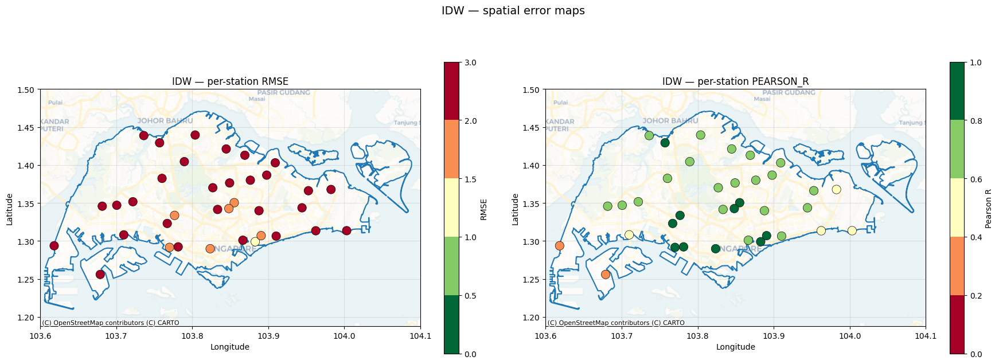

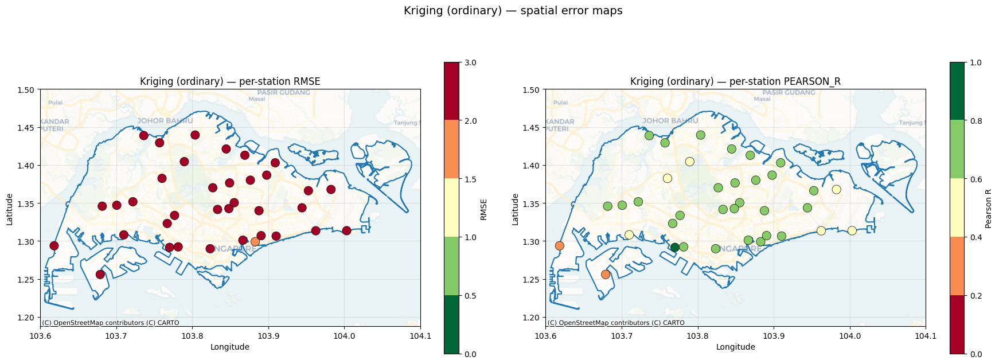

In [10]:
for name, sdf in station_dfs.items():
    m1, m2 = COMPARE_METRICS
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    plot_spatial_error_map(sdf, BOUNDS, metric=m1, top_n_labels=0, ax=axes[0],
                           title=f"{name} — per-station {m1.upper()}",
                           **METRIC_SCALES.get(m1, {}))
    plot_spatial_error_map(sdf, BOUNDS, metric=m2, top_n_labels=0, ax=axes[1],
                           title=f"{name} — per-station {m2.upper()}",
                           **METRIC_SCALES.get(m2, {}))
    fig.suptitle(f"{name} — spatial error maps", fontsize=14)
    plt.tight_layout()
    plt.show()

### Bias maps

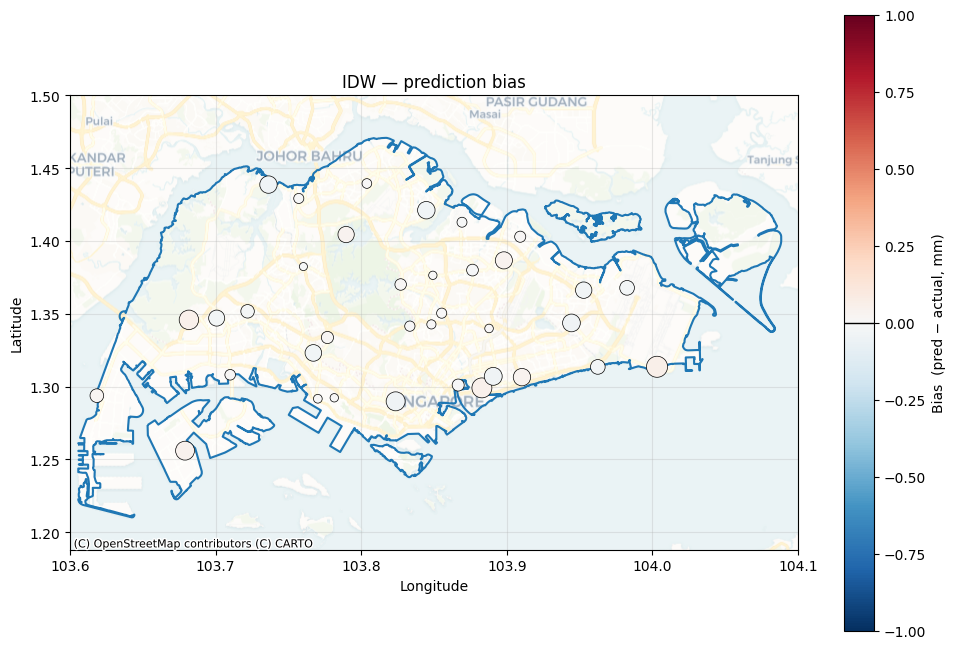

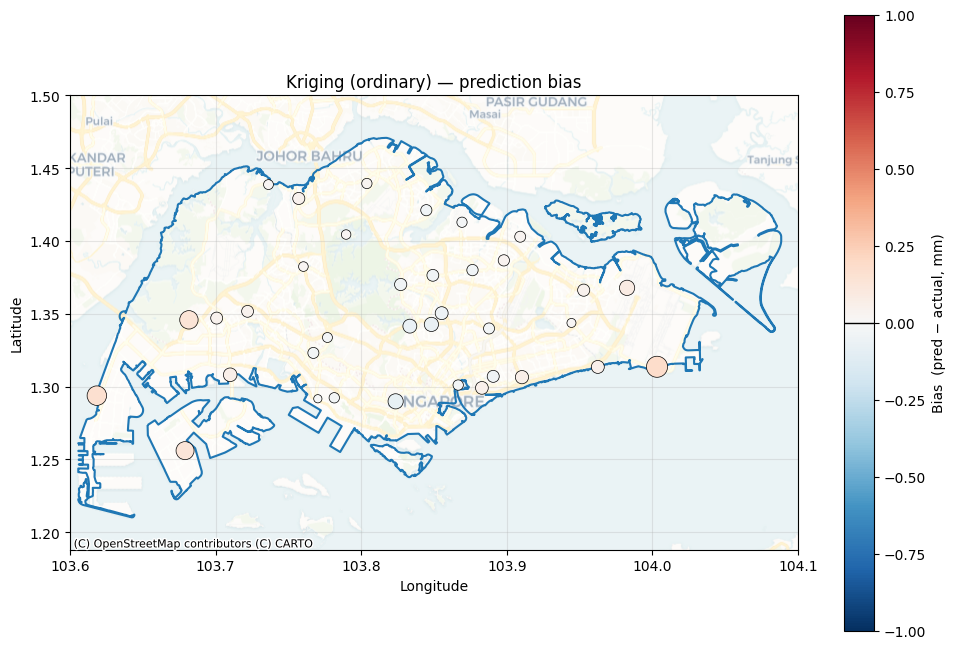

In [11]:
for name, sdf in station_dfs.items():
    fig, ax = plt.subplots(figsize=(10, 8))
    plot_bias_map(sdf, BOUNDS, top_n_labels=0, ax=ax,
                  title=f"{name} — prediction bias", vmax=1)
    visualise_singapore_outline(ax=ax)
    visualise_with_basemap(ax=ax)
    plt.tight_layout()
    plt.show()

### Worst-station rankings (MAE + F1)

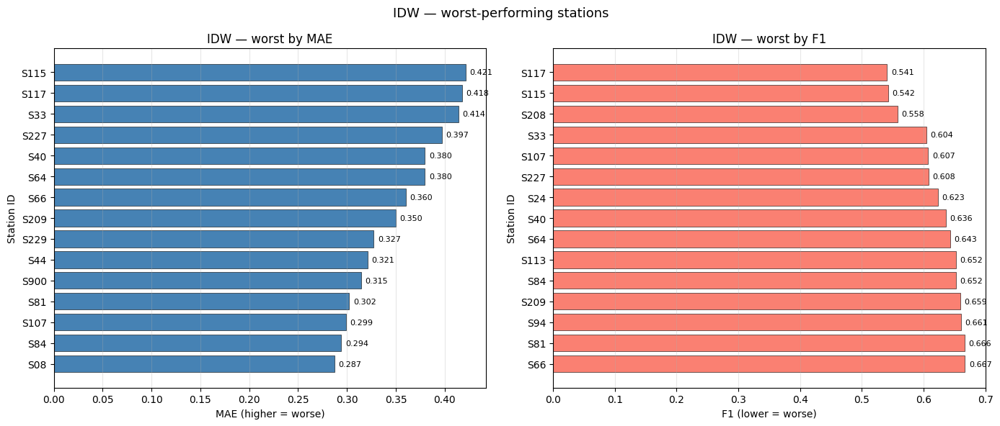

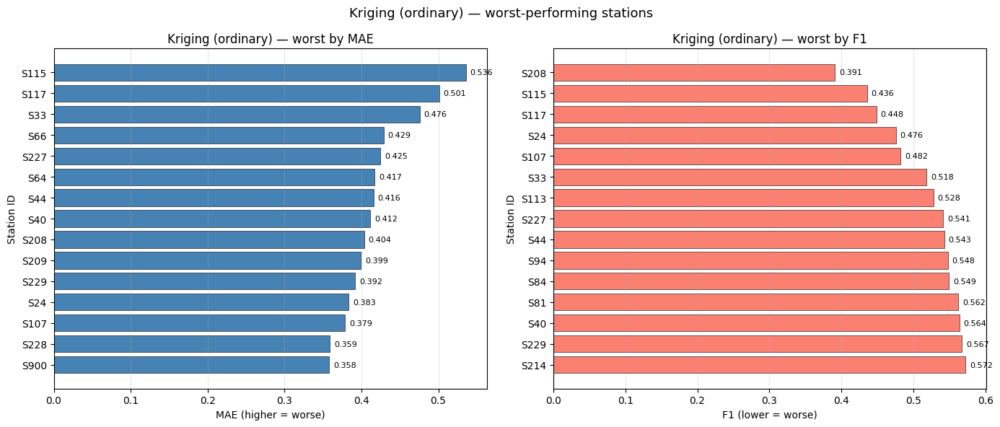

In [12]:
for name, sdf in station_dfs.items():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    plot_error_ranking(sdf, metric="mae", top_n=15, ax=ax1,
                       title=f"{name} — worst by MAE")
    plot_error_ranking(sdf, metric="f1",  top_n=15, ax=ax2,
                       title=f"{name} — worst by F1")
    fig.suptitle(f"{name} — worst-performing stations", fontsize=13)
    plt.tight_layout()
    plt.show()

### Error vs. spatial isolation

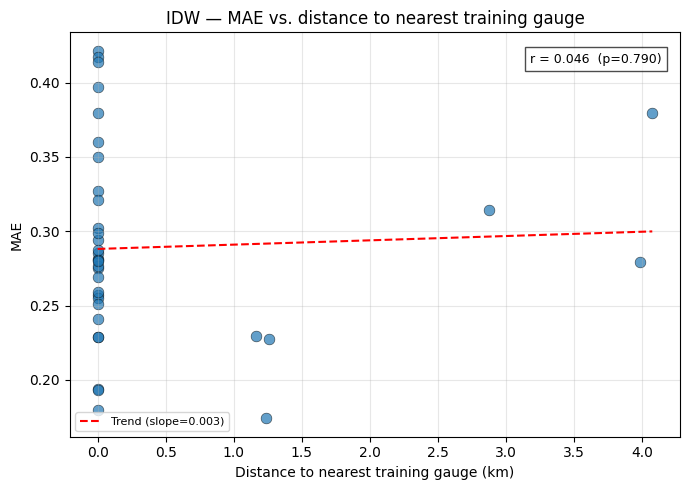

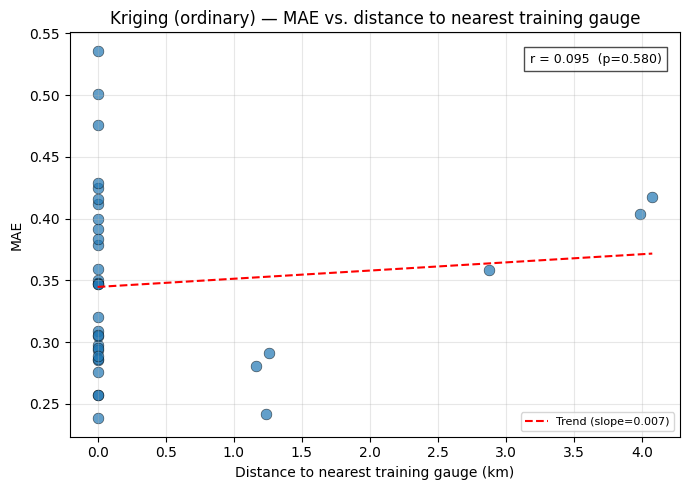

In [13]:
for name, sdf in station_dfs.items():
    fig, ax = plt.subplots(figsize=(7, 5))
    plot_error_vs_isolation(
        sdf, train_stations, coordinates,
        metric="mae", ax=ax,
        title=f"{name} — MAE vs. distance to nearest training gauge",
    )
    plt.tight_layout()
    plt.show()

---
# Part 2 – Regression Scatter Plots

### Individual scatter plots

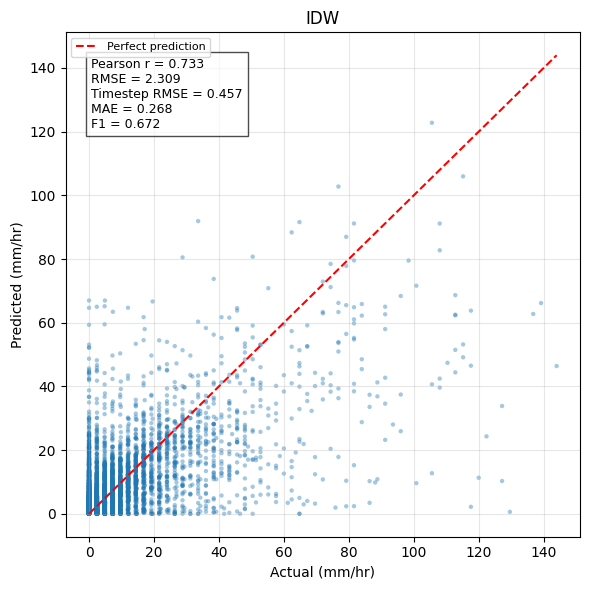

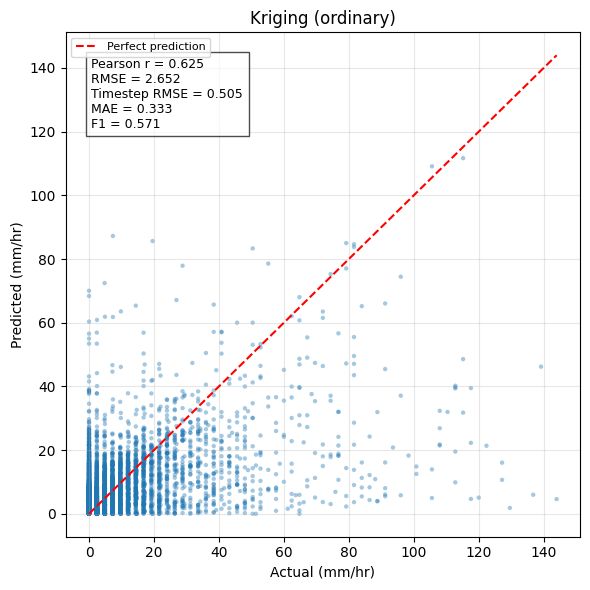

In [14]:
for name, r in all_results.items():
    fig, ax = plt.subplots(figsize=(6, 6))
    plot_regression_scatter(
        actual=r["actual_values"],
        predicted=r["predicted_values"],
        model_name=name,
        metrics=r["metrics"],
        ax=ax,
    )
    plt.tight_layout()
    plt.show()

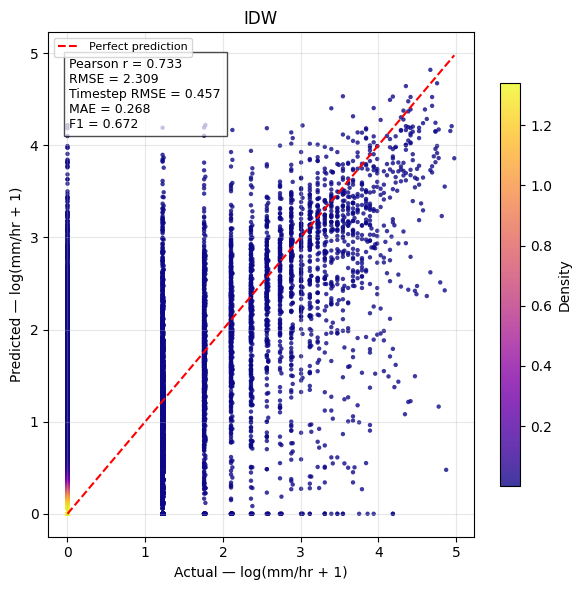

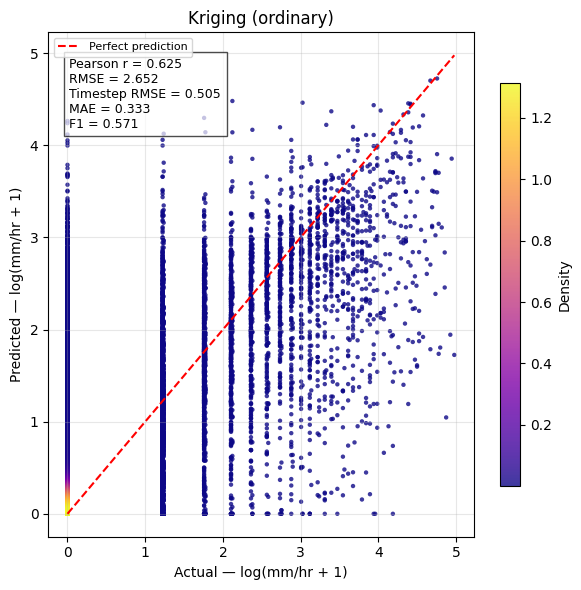

In [15]:
for name, r in all_results.items():
    fig, ax = plt.subplots(figsize=(6, 6))
    plot_density_scatter(
        actual=r["actual_values"],
        predicted=r["predicted_values"],
        model_name=name,
        metrics=r["metrics"],
        ax=ax,
    )
    plt.tight_layout()
    plt.show()

### Side-by-side comparison

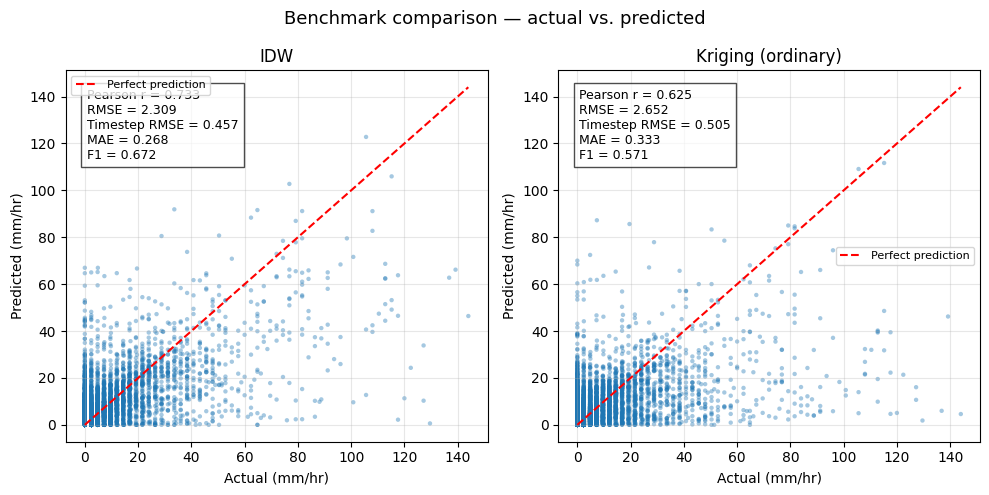

In [16]:
fig = plot_regression_comparison(
    results={
        name: {
            "actual":    r["actual_values"],
            "predicted": r["predicted_values"],
            "metrics":   r["metrics"],
        }
        for name, r in all_results.items()
    },
    title="Benchmark comparison — actual vs. predicted",
)
plt.show()

---
# Part 3 – Aggregate Metric Comparison

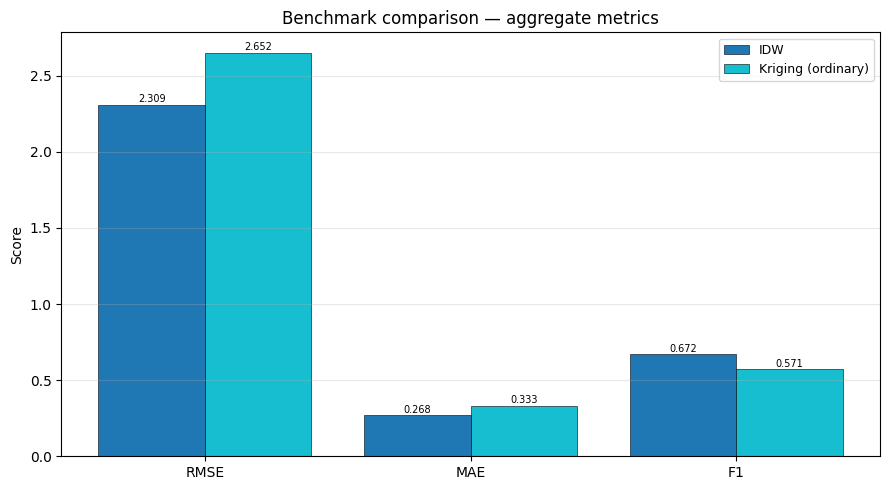

In [17]:
fig, ax = plt.subplots(figsize=(9, 5))
plot_metrics_comparison(
    all_results,
    metrics=("rmse", "mae", "f1"),
    title="Benchmark comparison — aggregate metrics",
    ax=ax,
)
plt.tight_layout()
plt.show()

---
# Part 4 – Per-Timestep Error Time Series

### Individual time series

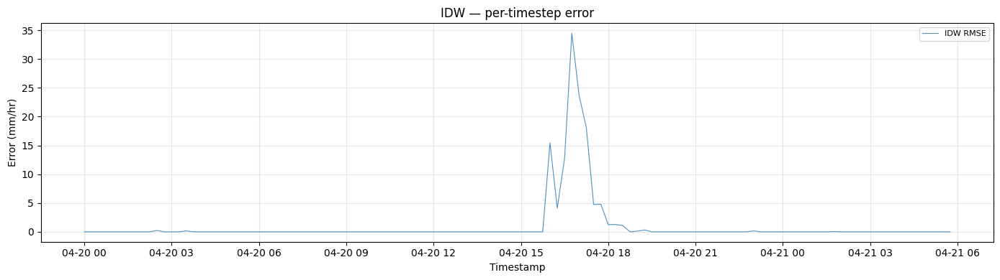

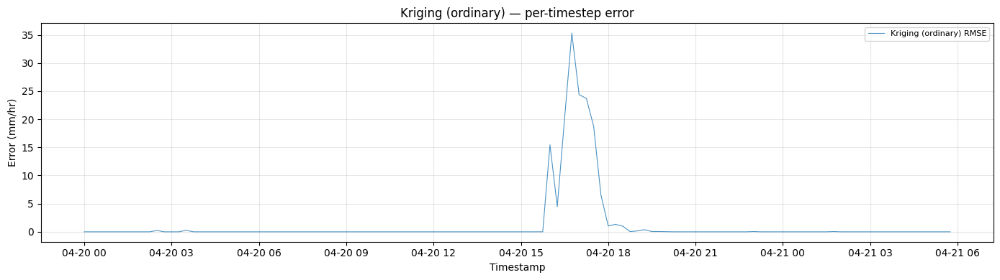

In [18]:
for name, r in all_results.items():
    fig, ax = plt.subplots(figsize=(14, 4))
    plot_timestep_metrics(
        r["per_timestep_metrics"],
        metrics=tuple(COMPARE_METRICS),
        model_name=name,
        ts_display_start=TS_DISPLAY_START,
        ts_frame_count=TS_FRAME_COUNT,
        ax=ax,
    )
    plt.tight_layout()
    plt.show()

### Overlaid comparison (RMSE)

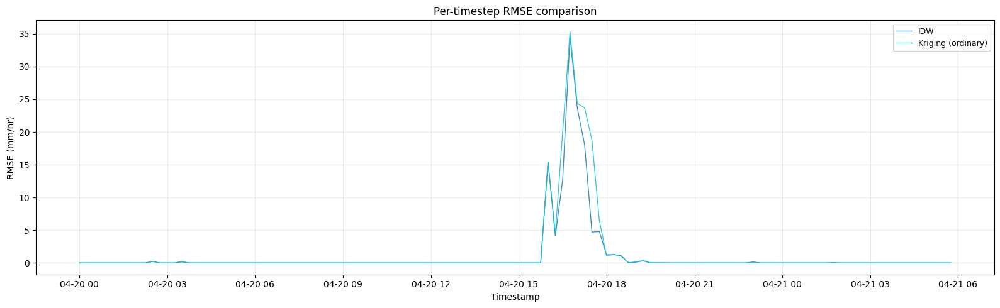

In [19]:
fig, ax = plt.subplots(figsize=(16, 5))
plot_timestep_comparison(
    all_results,
    metric=COMPARE_METRICS[0],
    rolling_window=1,
    ts_display_start=TS_DISPLAY_START,
    ts_frame_count=TS_FRAME_COUNT,
    title=f"Per-timestep {COMPARE_METRICS[0].upper()} comparison",
    ax=ax,
)
plt.tight_layout()
plt.show()

/Users/jylow/Documents/FYP/rainfall_data_fusion/benchmarks/visualization.py:875: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=9)


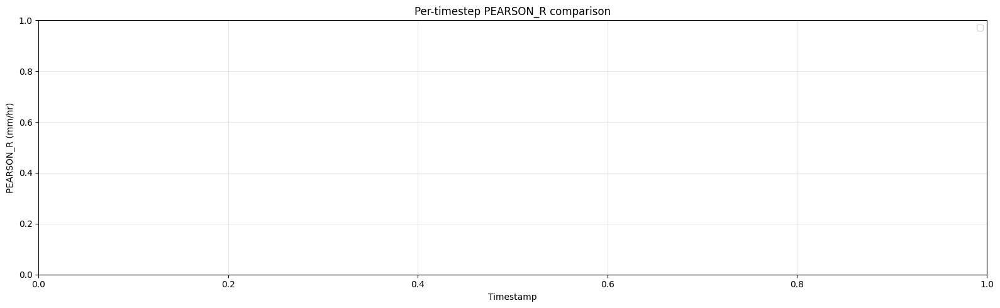

In [20]:
fig, ax = plt.subplots(figsize=(16, 5))
plot_timestep_comparison(
    all_results,
    metric=COMPARE_METRICS[1],
    rolling_window=ROLLING_WINDOW,
    ts_display_start=TS_DISPLAY_START,
    ts_frame_count=TS_FRAME_COUNT,
    title=f"Per-timestep {COMPARE_METRICS[1].upper()} comparison",
    ax=ax,
)
plt.tight_layout()
plt.show()

---
# Part 5 – Grid Visualisation

IDW-interpolates the test-station predictions onto a regular 1 km² grid, then
shows single-timestep heatmaps, a sequence panel, the mean rainfall map, and an
animation — matching the layout of `analysis.ipynb`.

Change `GRID_MODEL` at the top of the notebook to switch between benchmarks.

In [21]:
grid_result = all_results[GRID_MODEL]
predictions_df = grid_result["predictions_df"]
aligned_timestamps = predictions_df.index

print(f"Interpolating {GRID_MODEL} predictions onto {RESOLUTION_KM} km grid …")
print(f"Timesteps available: {len(predictions_df)}")

predictions, lons, lats, grid_shape = interpolate_to_grid(
    predictions_df=predictions_df,
    coordinates=coordinates,
    bounds=BOUNDS,
    resolution_km=RESOLUTION_KM,
    power=IDW_POWER,
    n_nearest=6,
)

print(f"Grid shape : {grid_shape}  ({grid_shape[0]} rows × {grid_shape[1]} cols)")
print(f"Array shape: {predictions.shape}")

Interpolating IDW predictions onto 1.0 km grid …
Timesteps available: 30274
Grid shape : (35, 56)  (35 rows × 56 cols)
Array shape: (30274, 35, 56)


### Single timestep

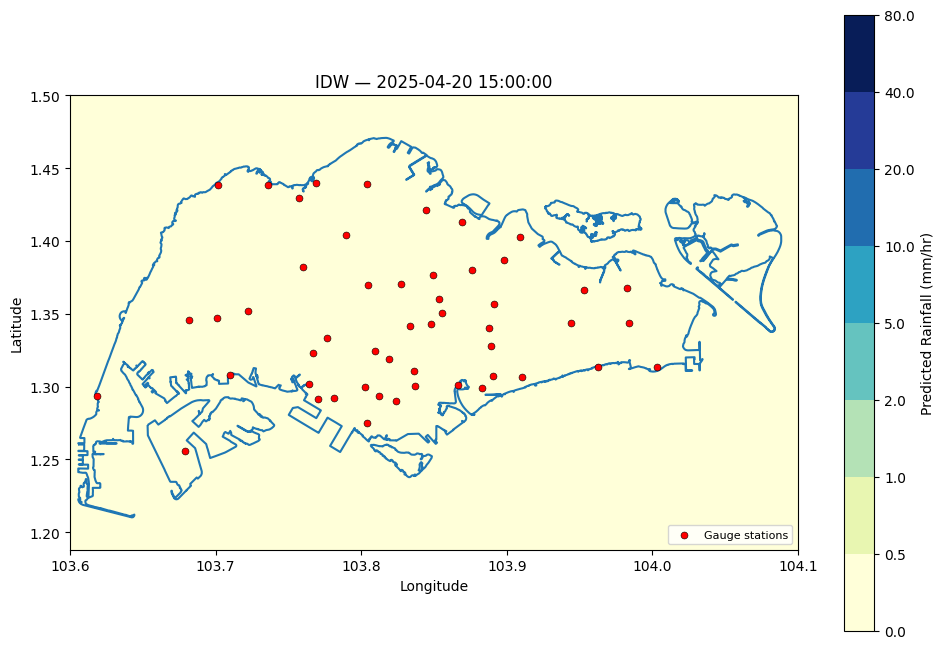

In [44]:
# ── CHANGE THIS ───────────────────────────────────────────────────────────────
TIMESTEP = 29373   # index into the predictions array (0 = first available timestep)
# ──────────────────────────────────────────────────────────────────────────────

ts_label = str(aligned_timestamps[TIMESTEP])

fig, ax = plt.subplots(figsize=(10, 8))
plot_rainfall_grid(
    predictions, grid_shape, BOUNDS,
    timestamp_idx=TIMESTEP,
    mapping_df=mapping_df,
    title=f"{GRID_MODEL} — {ts_label}",
    ax=ax,
    **RAINFALL_SCALE,
)
plt.tight_layout()
plt.show()

### Sequence of timesteps

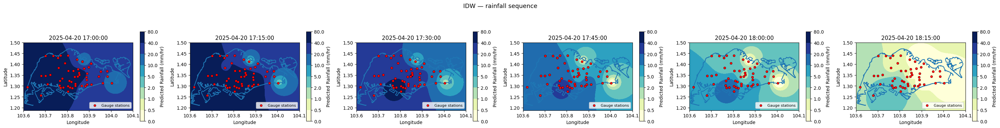

In [ ]:
# ── CHANGE THESE ──────────────────────────────────────────────────────────────
SEQ_START  = 29381    # first timestep index in the sequence
SEQ_LENGTH = 6        # number of panels
# ──────────────────────────────────────────────────────────────────────────────

timestep_indices = list(range(SEQ_START, SEQ_START + SEQ_LENGTH))
seq_titles = [str(aligned_timestamps[t]) for t in timestep_indices]

fig = plot_rainfall_sequence(
    predictions, grid_shape, BOUNDS,
    timestep_indices=timestep_indices,
    mapping_df=mapping_df,
    titles=seq_titles,
    **RAINFALL_SCALE,
)
plt.suptitle(f"{GRID_MODEL} — rainfall sequence", fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

### Mean rainfall over the full evaluation period

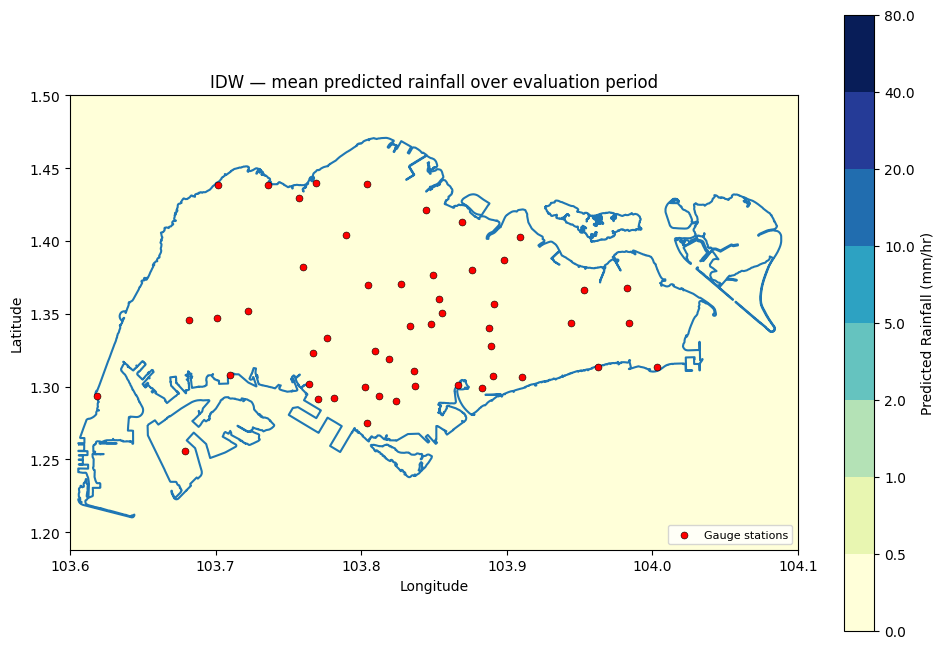

In [24]:
mean_pred     = np.nanmean(predictions, axis=0)          # [n_rows, n_cols]
mean_pred_3d  = mean_pred[np.newaxis, :, :]              # [1, n_rows, n_cols]

fig, ax = plt.subplots(figsize=(10, 8))
plot_rainfall_grid(
    mean_pred_3d, grid_shape, BOUNDS,
    timestamp_idx=0,
    mapping_df=mapping_df,
    title=f"{GRID_MODEL} — mean predicted rainfall over evaluation period",
    ax=ax,
    **RAINFALL_SCALE,
)
plt.tight_layout()
plt.show()

### Side-by-side mean rainfall — all models

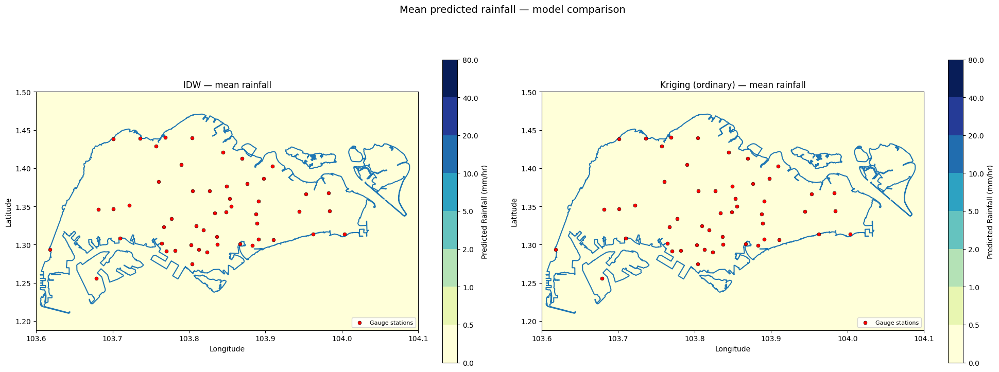

In [25]:
model_names = list(all_results.keys())
n_models    = len(model_names)
fig, axes   = plt.subplots(1, n_models, figsize=(10 * n_models, 8))
if n_models == 1:
    axes = [axes]

for ax, name in zip(axes, model_names):
    r   = all_results[name]
    pdf = r["predictions_df"]
    preds, _, _, gs = interpolate_to_grid(
        pdf, coordinates, BOUNDS, resolution_km=RESOLUTION_KM, power=IDW_POWER
    )
    mean_3d = np.nanmean(preds, axis=0)[np.newaxis, :, :]
    plot_rainfall_grid(
        mean_3d, gs, BOUNDS,
        timestamp_idx=0,
        mapping_df=mapping_df,
        title=f"{name} — mean rainfall",
        ax=ax,
        **RAINFALL_SCALE,
    )

fig.suptitle("Mean predicted rainfall — model comparison", fontsize=14)
plt.tight_layout()
plt.show()

### Time series animation

Animates the gridded predictions as a spatial heatmap.
Rendered inline with `HTML(anim.to_jshtml())`.

Animation saved to benchmark_animation.gif


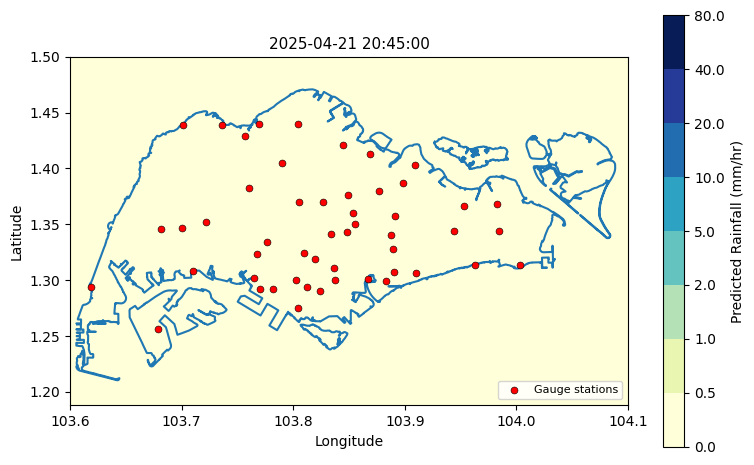

In [45]:
# ── CHANGE THESE ──────────────────────────────────────────────────────────────
N_FRAMES    = 120    # number of timesteps to animate (96 × 15-min = 24 hours)
ANIM_START  = 29373  # first timestep index
INTERVAL_MS = 150    # ms between frames
# ──────────────────────────────────────────────────────────────────────────────

anim_indices    = list(range(ANIM_START, ANIM_START + N_FRAMES))
anim_timestamps = [str(aligned_timestamps[t]) for t in anim_indices]

anim = animate_rainfall_grid(
    predictions, grid_shape, BOUNDS,
    timestep_indices=anim_indices,
    timestamps=anim_timestamps,
    mapping_df=mapping_df,
    interval_ms=INTERVAL_MS,
    save_path="benchmark_animation.gif",
    **RAINFALL_SCALE,
)

HTML(anim.to_jshtml())

---
# Part 6 – Per-Station Rainfall Time Series

Plots actual vs predicted rainfall for a single station over a configurable
time window.  Set `SELECTED_STATION` in the config cell (or `analysis.selected_station`
in `config.yaml`) to pin a specific station; otherwise the first test station in the
reference fold is used automatically.

Plotting station: S88
Time window     : 2024-06-17 → 2025-04-30


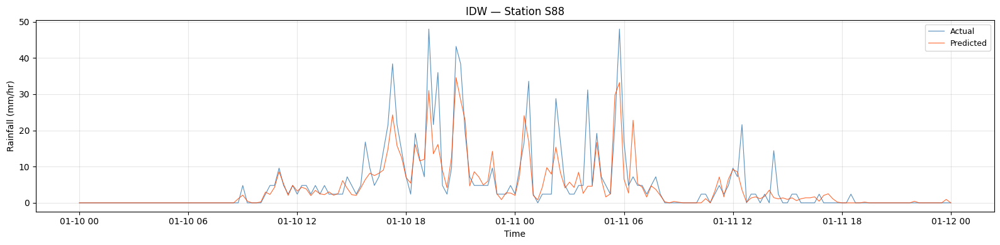

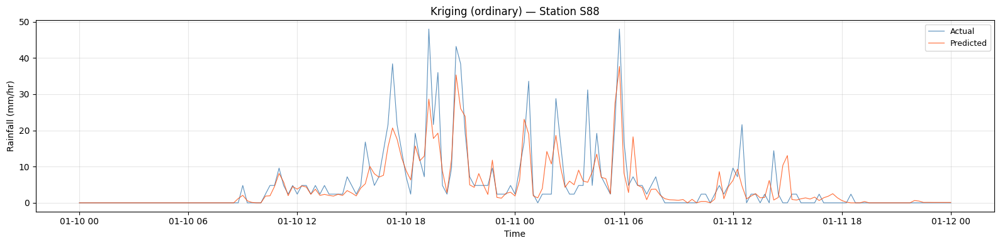

In [27]:
# Determine which station to plot
_first_test = list(split_info[FOLD_IDX]["statistical"]["test"])[0]
STATION_ID = SELECTED_STATION if SELECTED_STATION is not None else _first_test

# Verify the station appears in the merged predictions
_sample_preds, _sample_actuals = merged_predictions["IDW"]
available_stations = list(_sample_preds.columns)
if STATION_ID not in available_stations:
    print(f"⚠  Station '{STATION_ID}' not found. Available: {available_stations[:10]} …")
    STATION_ID = available_stations[0]

print(f"Plotting station: {STATION_ID}")
print(f"Time window     : {TIME_START or 'start'} → {TIME_END or 'end'}")

for name, (preds_df, actuals_df) in merged_predictions.items():
    if STATION_ID not in preds_df.columns:
        print(f"  {name}: station not in fold — skipping")
        continue
    fig, ax = plt.subplots(figsize=(16, 4))
    plot_station_rainfall_timeseries(
        predictions_df=preds_df,
        actuals_df=actuals_df,
        station_id='S84',
        time_start='2025-01-10',
        time_end='2025-01-12',
        title=f"{name} — Station {STATION_ID}",
        ax=ax,
    )
    plt.tight_layout()
    plt.show()

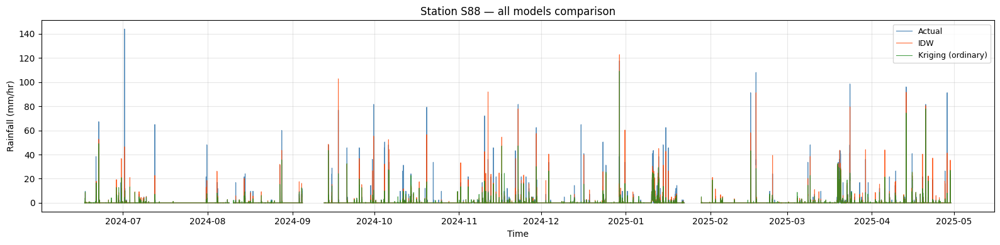

In [28]:
# ── Side-by-side comparison for all models on the same axes ──────────────────
fig, ax = plt.subplots(figsize=(16, 4))
_plotted_actual = False
colours = ["orangered", "forestgreen", "purple", "goldenrod"]

for (name, (preds_df, actuals_df)), colour in zip(merged_predictions.items(), colours):
    if STATION_ID not in preds_df.columns:
        continue
    pred = preds_df[STATION_ID].copy()
    act  = actuals_df[STATION_ID].copy()
    if TIME_START:
        pred = pred[pred.index >= pd.Timestamp(TIME_START)]
        act  = act[act.index  >= pd.Timestamp(TIME_START)]
    if TIME_END:
        pred = pred[pred.index <= pd.Timestamp(TIME_END)]
        act  = act[act.index  <= pd.Timestamp(TIME_END)]
    if not _plotted_actual:
        ax.plot(act.index, act.values, label="Actual", color="steelblue",
                linewidth=0.9, alpha=0.9)
        _plotted_actual = True
    ax.plot(pred.index, pred.values, label=name, color=colour,
            linewidth=0.8, alpha=0.8)

ax.set_xlabel("Time")
ax.set_ylabel("Rainfall (mm/hr)")
ax.set_title(f"Station {STATION_ID} — all models comparison")
ax.legend(fontsize=9)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()